In [4]:
import run_optimization
import pandas as pd
import europe_plots as ep
import importlib
import optimization_plots as oplot
import numpy as np
import analyze_lpj_output as analysis

In [5]:
# raw model outputs
MODEL_OUTPUTS_DIRECTORY = '/media/konni/bfm-work-ext1/konstantin/constrained_opt/revision_runs_full_eu/'

# ecosystem service indicators generated from the model outputs
OPTIMIZATION_DATA_FILE = 'optimization_datasets/data_for_optimization_after_revision_2024_06_01_22_26_42_FINAL_REVISION_WITH_NEW_BIODIV.dat'

GRIDLIST_ALL_CELLS = 'optimization_datasets/gridlist_full_europe.txt' # will not run on a laptop
GRIDLIST_300_CELLS = 'optimization_datasets/gridlist_every_tenth_europe.txt' # will run on a laptop
GRIDLIST_2_CELLS = 'optimization_datasets/gridlist_two_cells_europe.txt'

# Sample optimization for ~300 grid cells

This can be run on a personal laptop with ~16GB RAM available.
Running the optimization for all ~3000 grid cells requires a supercomputer.

## SUM

In [6]:
import optimize_gridcell
importlib.reload(run_optimization)
importlib.reload(optimize_gridcell)
sample_optimized_sum = run_optimization.run_optimization(
    run_dir=MODEL_OUTPUTS_DIRECTORY,
    gridlist=GRIDLIST_300_CELLS,
    minmax=False,
    dataset_prepared_for_optimization=OPTIMIZATION_DATA_FILE)

### Starting, 2024-07-06 16:01:58.357357
Combining all inputs into one LP
SKIP GC!41.75, 22.75
SKIP GC!44.25, 23.75
SKIP GC!45.75, 29.25
SKIP GC!45.25, 28.25
size of LP, eqs: (290, 2030) , ineqs: (8120, 2030)
Starting optimization...
Optimization is done.
Aggregating results
### Done. 2024-07-06 16:03:04.612548


## MAXIMIN

In [7]:
import optimize_gridcell
importlib.reload(run_optimization)
importlib.reload(optimize_gridcell)
sample_optimized_minmax = run_optimization.run_optimization(
    run_dir=MODEL_OUTPUTS_DIRECTORY,
    gridlist=GRIDLIST_300_CELLS,
    minmax=True,
    dataset_prepared_for_optimization=OPTIMIZATION_DATA_FILE)

### Starting, 2024-07-06 16:03:16.198909
Combining all inputs into one LP
SKIP GC!41.75, 22.75
SKIP GC!44.25, 23.75
SKIP GC!45.75, 29.25
SKIP GC!45.25, 28.25
size of LP, eqs: (290, 2031) , ineqs: (8410, 2031)
Starting optimization...
Optimization is done.
Aggregating results
### Done. 2024-07-06 16:04:14.792713


## Performance differences

In [8]:
gc_performances = []

for cell_out in sample_optimized_sum:
    portfolio = cell_out['all_rcp_solution_new'].x[1:]
    # objective function is z + omegas
    gc_worst_case = 1-cell_out['all_rcp_solution_new'].x[0]
    gc_average_performances = np.dot(portfolio, cell_out['es_vals_all_rcps_new'].sum(axis=0)/28)
    gc_performance = 0.8 * gc_worst_case + 0.2 * gc_average_performances

    gc_performances.append(gc_performance)

gc_performances_sum = gc_performances

gc_performances = []

for cell_out in sample_optimized_minmax:
    portfolio = cell_out['all_rcp_solution_new'].x[1:]
    # objective function is z + omegas
    gc_worst_case = 1-cell_out['all_rcp_solution_new'].x[0]
    gc_average_performances = np.dot(portfolio, cell_out['es_vals_all_rcps_new'].sum(axis=0)/28)
    gc_performance = 0.8 * gc_worst_case + 0.2 * gc_average_performances

    gc_performances.append(gc_performance)

gc_performances_minmax = gc_performances

In [9]:
diffs = np.abs(np.array(gc_performances_minmax)-np.array(gc_performances_sum))

In [10]:
np.max(diffs)

3.3306690738754696e-16

As expected, the performances are equal between the two optimizations.

## Plot the results

In [11]:
importlib.reload(ep)
def plot_result(result, save_for_paper_path_aggregated=None, save_for_paper_path_detailed=None):
    df = []
    for cell_result in result:
        ddff = pd.DataFrame(cell_result['row']).transpose()
        ddff['feasible'] = True
        df.append(ddff)

    all_pies = ep.plot_portfolios_on_map(pd.concat(df), lambda_opt=0.2, print_cell_info=True,
                                         save_for_paper_path=save_for_paper_path_detailed).set_index(['Lon', 'Lat'])
    aggregated = ep.plot_europe_with_pies(all_pies, save_for_paper_path=save_for_paper_path_aggregated)

    return all_pies, aggregated

did not find a region for 0 cells


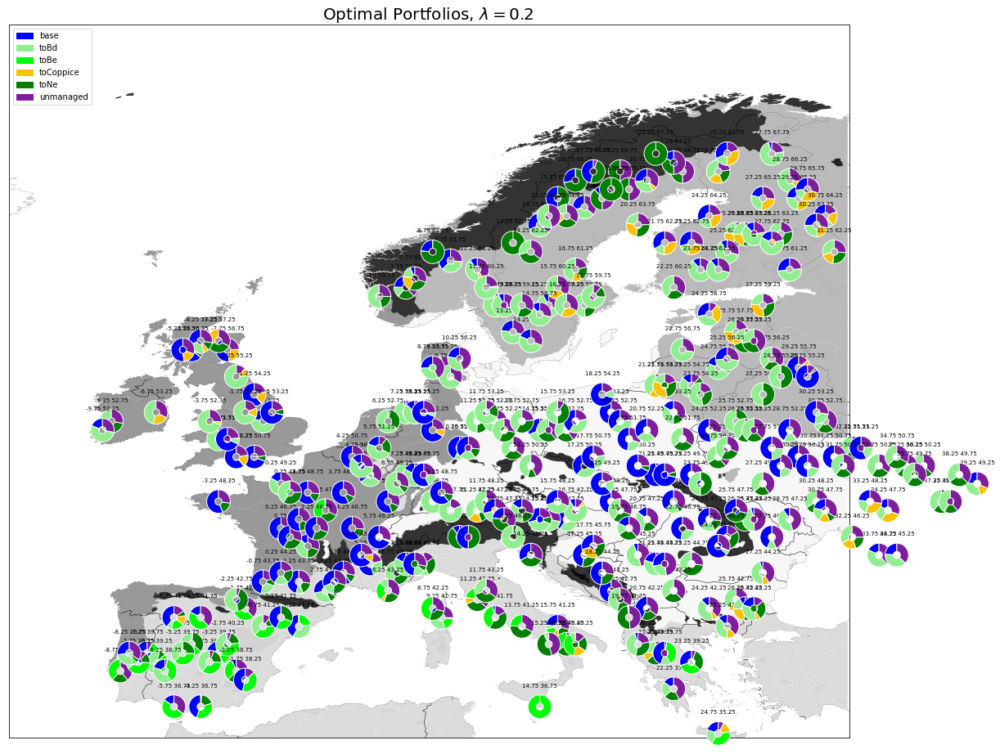

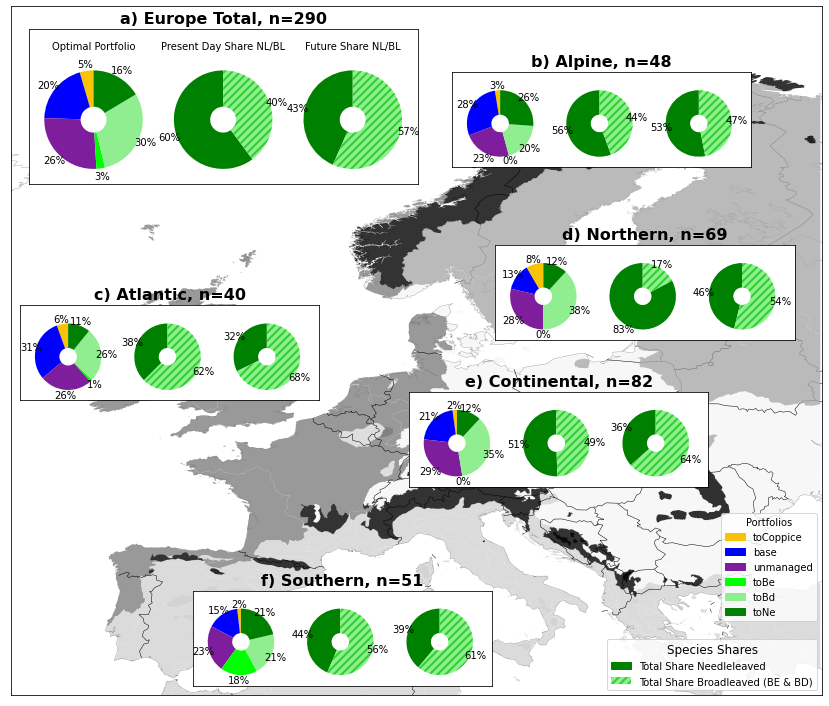

In [12]:
a, b = plot_result(sample_optimized_sum)

did not find a region for 0 cells


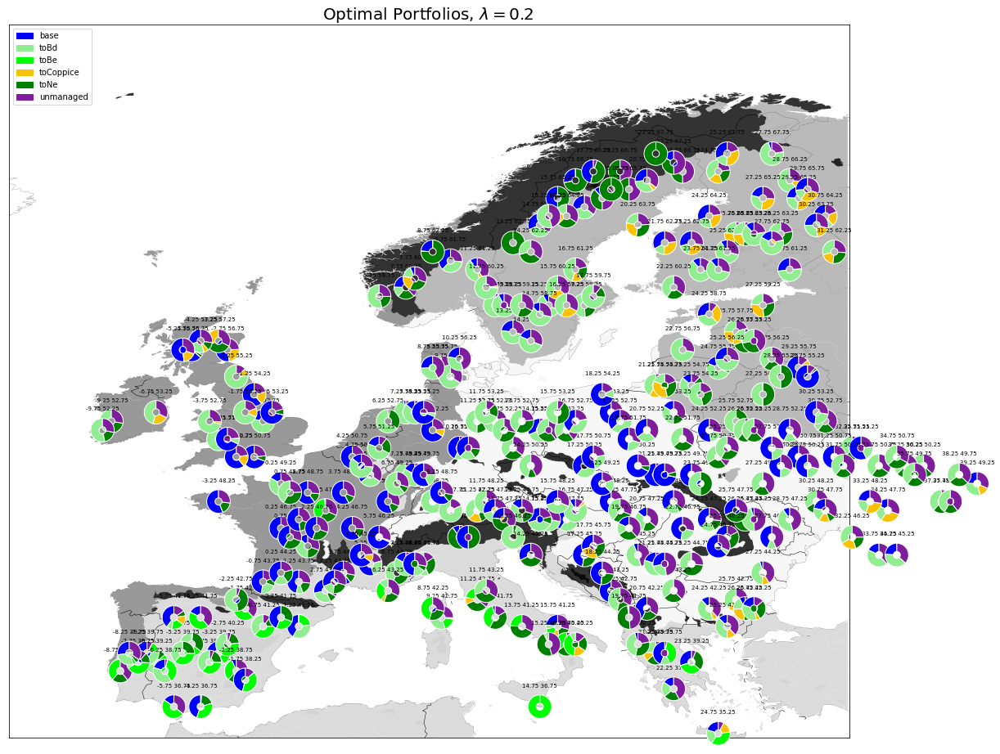

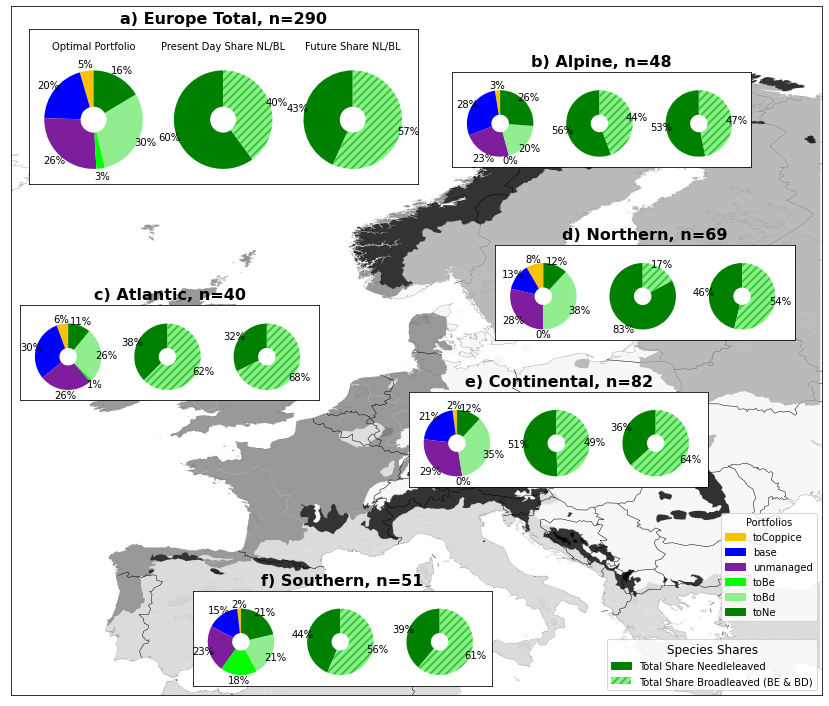

In [13]:
_ = plot_result(sample_optimized_minmax)

We see that the results are mathematically equivalent, as expected. Note that tiny differences can occur when a grid cell is currently covered by only one management type, for instance needle-leaved forest. In that case, `toNe` and `base` are exactly the same and the solver can select both in the optimization, leading to minor apparent differences between SUM and MAXIMIN.
Technically, there could also be the case that two portfolios provide the same performance for a grid cell. In that case it can also happen that one optimization selects the one portfolio and another optimization selects the other.

# Sample optimization with constraints

## For two grid cells first

This is to show how the two methods (SUM, MAXIMIN) impact the results.

In [14]:
minimal_example_optimized_sum = run_optimization.run_optimization(
    run_dir=MODEL_OUTPUTS_DIRECTORY,
    gridlist=GRIDLIST_2_CELLS,
    minmax=False,
    unmanaged_constraint=0.5,
    dataset_prepared_for_optimization=OPTIMIZATION_DATA_FILE)

minimal_example_optimized_maximin = run_optimization.run_optimization(
    run_dir=MODEL_OUTPUTS_DIRECTORY,
    gridlist=GRIDLIST_2_CELLS,
    minmax=True,
    unmanaged_constraint=0.5,
    dataset_prepared_for_optimization=OPTIMIZATION_DATA_FILE)

### Starting, 2024-07-06 16:06:51.520781
Combining all inputs into one LP
size of LP, eqs: (2, 14) , ineqs: (57, 14)
Starting optimization...
Optimization is done.
Aggregating results
### Done. 2024-07-06 16:06:53.037759
### Starting, 2024-07-06 16:06:56.407966
Combining all inputs into one LP
size of LP, eqs: (2, 15) , ineqs: (59, 15)
Starting optimization...
Optimization is done.
Aggregating results
### Done. 2024-07-06 16:06:57.343957


In [15]:
gc_performances_sum = []
gc_performances_minmax = []

def get_performance(cell_out):
    portfolio = cell_out['all_rcp_solution_new'].x[1:]
    # objective function is z + omegas
    gc_worst_case = 1 - cell_out['all_rcp_solution_new'].x[0]
    gc_average_performances = np.dot(portfolio, cell_out['es_vals_all_rcps_new'].sum(axis=0) / 28)
    return 0.8 * gc_worst_case + 0.2 * gc_average_performances

different_results = 0
for cell_out_sum, cell_out_minmax in zip(minimal_example_optimized_sum, minimal_example_optimized_maximin):

    gc_performances_sum.append(get_performance(cell_out_sum))
    gc_performances_minmax.append(get_performance(cell_out_minmax))

    print('SUM')
    _ = oplot.plot_optimization_results2(cell_out_sum, luyssaert=False, radar=False, simulations_of_interest=run_optimization.used_simulations, save_to=None)
    print('MAXIMIN')
    _ = oplot.plot_optimization_results2(cell_out_minmax, luyssaert=False, radar=False, simulations_of_interest=run_optimization.used_simulations, save_to=None)

    if np.abs(gc_performances_minmax[-1] - gc_performances_sum[-1]) > 0.001:
        different_results+=1

print('SUM WORST PERFORMANCE', np.min(gc_performances_sum))
print('MAXIMIN WORST PERFORMANCE', np.min(gc_performances_minmax))
print('SUM MEAN PERFORMANCE', np.mean(gc_performances_sum))
print('MAXIMIN MEAN PERFORMANCE', np.mean(gc_performances_minmax))
print('DIFFERENT CELLS', different_results)

SUM


MAXIMIN


SUM


MAXIMIN


SUM WORST PERFORMANCE 0.3020357914086703
MAXIMIN WORST PERFORMANCE 0.34415110748806843
SUM MEAN PERFORMANCE 0.35679714488103575
MAXIMIN MEAN PERFORMANCE 0.34415110748806854
DIFFERENT CELLS 2


We can see that in the MAXIMIN method, the burden of the constraint for unmanaged forest is equally distributed (50.1% and 49.7%)
In the SUM method, this was not the case, with 58.1% and 30.6%, respectively.

Considering the forest areas of the cells, both allocations lead to 50% of the joint forest area are unmanaged:

In [16]:
gcs = run_optimization.add_area_and_forest_frac2(pd.DataFrame({'Lon': [23.75, 21.75], 'Lat': [61.75, 39.75]}), basepath=MODEL_OUTPUTS_DIRECTORY + 'base_rcp45/')
gcs['forestarea'] = gcs['forest_frac'] * gcs['area']

In [17]:
gcs['forestarea'][0] * 0.581 + gcs['forestarea'][1] * 0.306

708426019.4483069

In [18]:
0.5 * (gcs['forestarea'][0] + gcs['forestarea'][1])

708579395.1290845

## For ~300 Grid cells

In [19]:
import optimize_gridcell
import optimization
importlib.reload(optimization)
importlib.reload(run_optimization)
importlib.reload(optimize_gridcell)

sample_optimized_sum_unmanaged_constraint = run_optimization.run_optimization(
    run_dir=MODEL_OUTPUTS_DIRECTORY,
    gridlist=GRIDLIST_300_CELLS,
    minmax=False,
    unmanaged_constraint=0.5,
    dataset_prepared_for_optimization=OPTIMIZATION_DATA_FILE)

import optimize_gridcell
importlib.reload(run_optimization)
importlib.reload(optimize_gridcell)
sample_optimized_maximin_unmanaged_constraint = run_optimization.run_optimization(
    run_dir=MODEL_OUTPUTS_DIRECTORY,
    gridlist=GRIDLIST_300_CELLS,
    minmax=True,
    unmanaged_constraint=0.5,
    dataset_prepared_for_optimization=OPTIMIZATION_DATA_FILE)

### Starting, 2024-07-06 16:07:02.615923
Combining all inputs into one LP
SKIP GC!41.75, 22.75
SKIP GC!44.25, 23.75
SKIP GC!45.75, 29.25
SKIP GC!45.25, 28.25
size of LP, eqs: (290, 2030) , ineqs: (8121, 2030)
Starting optimization...
Optimization is done.
Aggregating results
### Done. 2024-07-06 16:08:01.791458
### Starting, 2024-07-06 16:08:06.752628
Combining all inputs into one LP
SKIP GC!41.75, 22.75
SKIP GC!44.25, 23.75
SKIP GC!45.75, 29.25
SKIP GC!45.25, 28.25
size of LP, eqs: (290, 2031) , ineqs: (8411, 2031)
Starting optimization...
Optimization is done.
Aggregating results
### Done. 2024-07-06 16:09:07.701798


### Performance differences

In [20]:
gc_performances_sum = []
gc_performances_minmax = []


def get_performance(cell_out):
    portfolio = cell_out['all_rcp_solution_new'].x[1:]
    # objective function is z + omegas
    gc_worst_case = 1 - cell_out['all_rcp_solution_new'].x[0]
    gc_average_performances = np.dot(portfolio, cell_out['es_vals_all_rcps_new'].sum(axis=0) / 28)
    return 0.8 * gc_worst_case + 0.2 * gc_average_performances

different_results = 0
for cell_out_sum, cell_out_minmax in zip(sample_optimized_sum_unmanaged_constraint, sample_optimized_maximin_unmanaged_constraint):

    gc_performances_sum.append(get_performance(cell_out_sum))
    gc_performances_minmax.append(get_performance(cell_out_minmax))

    if np.abs(gc_performances_minmax[-1] - gc_performances_sum[-1]) > 0.001:
        different_results+=1

print('SUM WORST PERFORMANCE', np.min(gc_performances_sum))
print('MAXIMIN WORST PERFORMANCE', np.min(gc_performances_minmax))
print('SUM MEAN PERFORMANCE', np.mean(gc_performances_sum))
print('MAXIMIN MEAN PERFORMANCE', np.mean(gc_performances_minmax))
print('DIFFERENT CELLS', different_results)

SUM WORST PERFORMANCE 0.034786373772448594
MAXIMIN WORST PERFORMANCE 0.1346036435301151
SUM MEAN PERFORMANCE 0.44863514503427177
MAXIMIN MEAN PERFORMANCE 0.447125406367484
DIFFERENT CELLS 35


So in a few cells there are some differences. The worst case performance of all cells is higher in the MAXIMIN optimization, but the average performance is a bit higher in the SUM optimization, as expected. 

### Plots

did not find a region for 0 cells


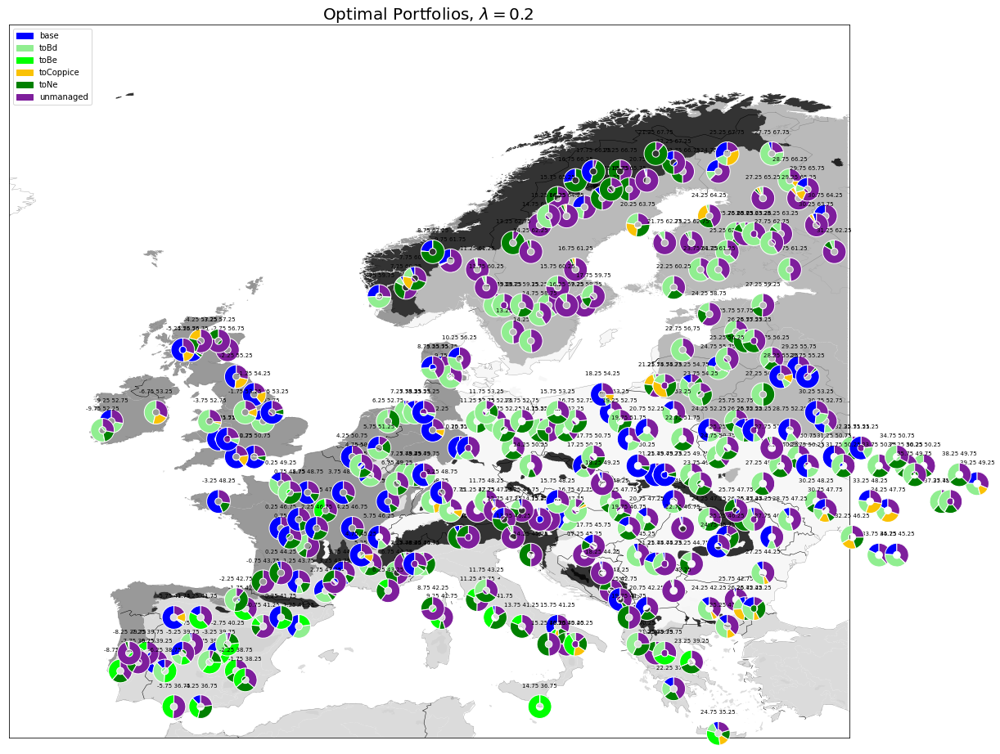

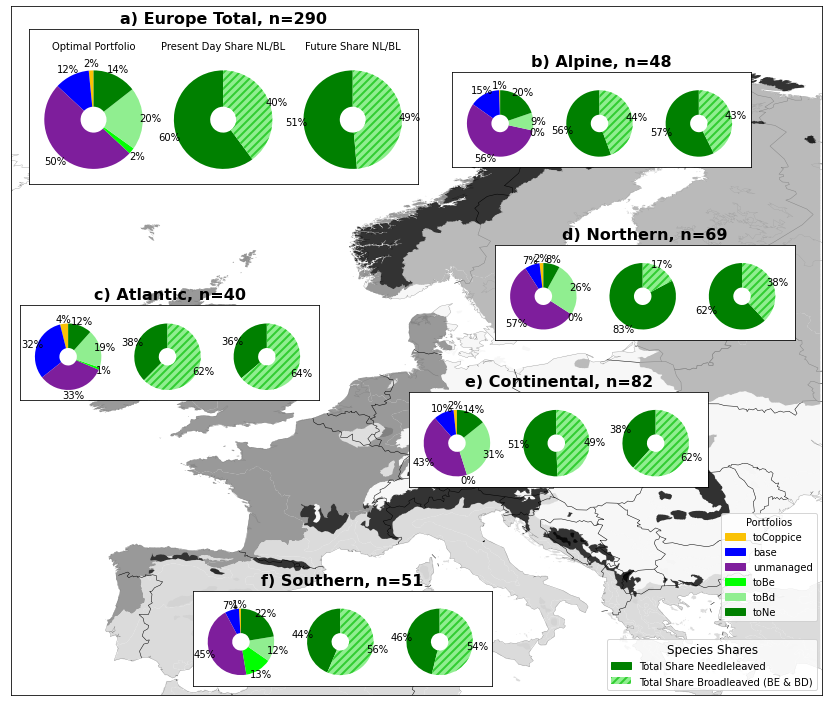

In [21]:
_ = plot_result(sample_optimized_maximin_unmanaged_constraint)

did not find a region for 0 cells


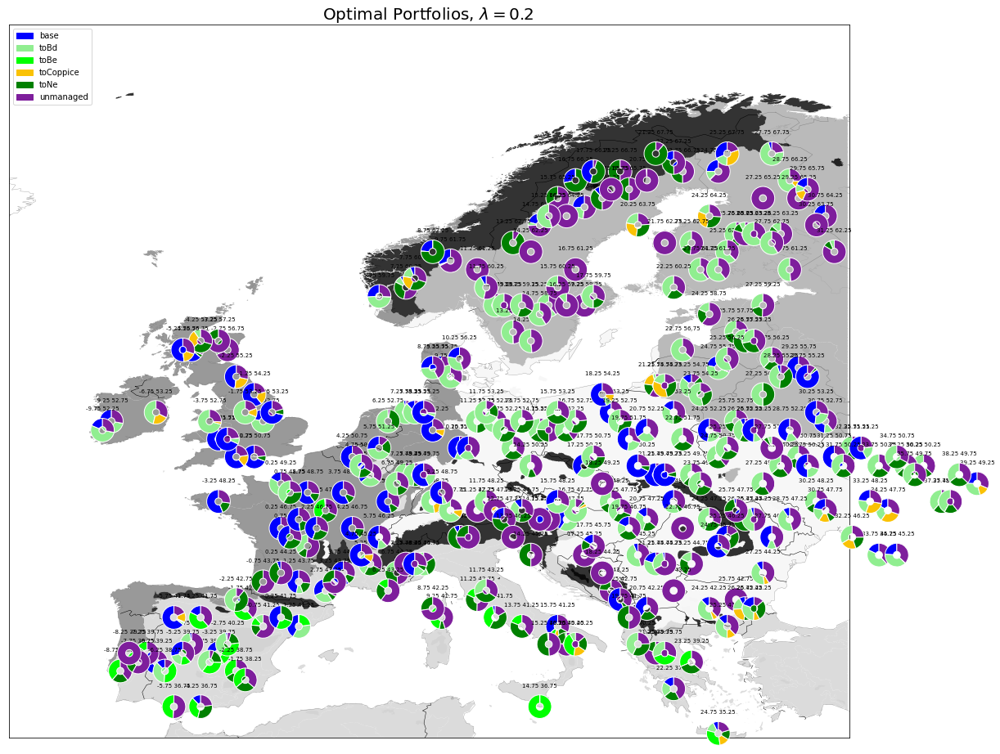

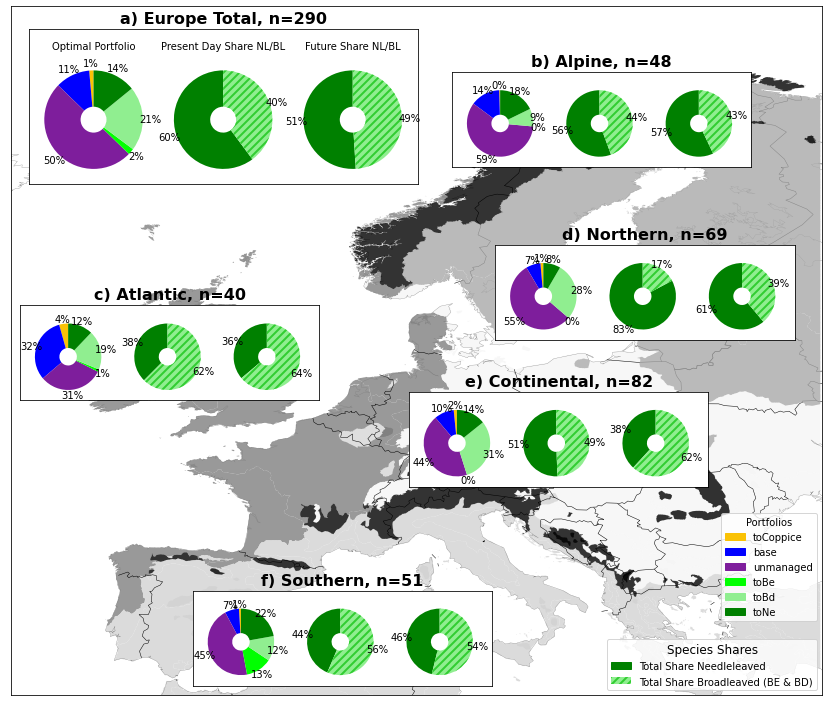

did not find a region for 0 cells


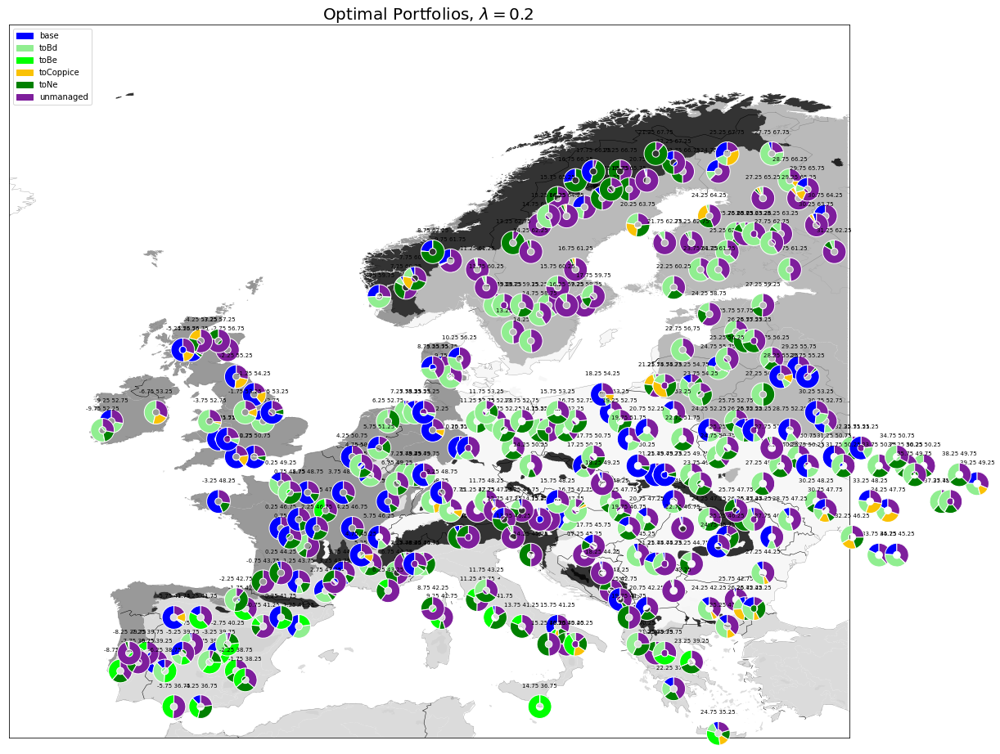

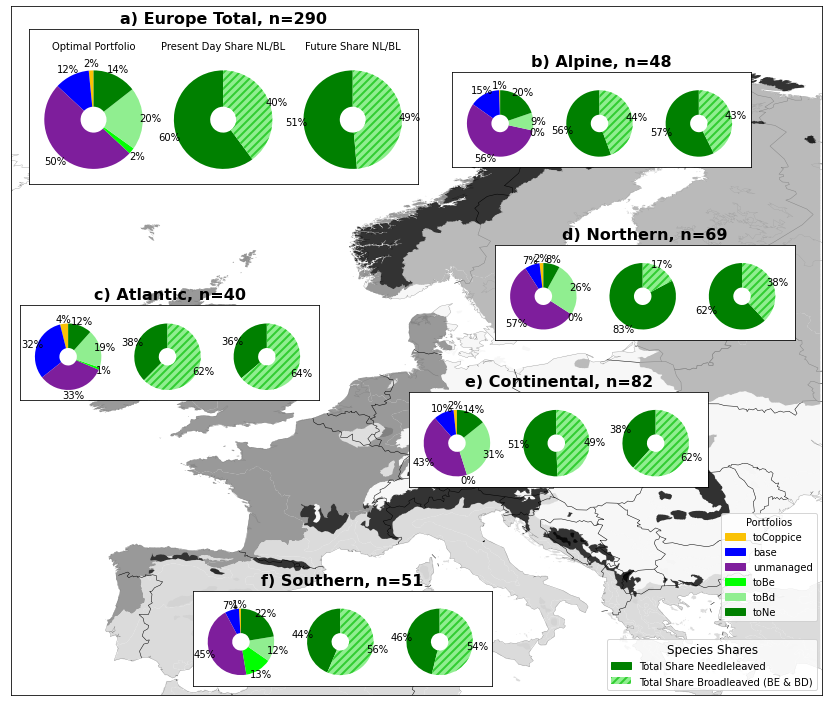

In [22]:
_ = plot_result(sample_optimized_sum_unmanaged_constraint)
_ = plot_result(sample_optimized_maximin_unmanaged_constraint)

So we can see that the choice of optimization only has a marginal effect on the portfolios.

## Protection in every cell

In [23]:
sample_optimized_maximin_constrained_cell = run_optimization.run_optimization(
    run_dir=MODEL_OUTPUTS_DIRECTORY,
    gridlist=GRIDLIST_300_CELLS,
    minmax=False,
    unmanaged_constraint_every_cell=0.5,
    dataset_prepared_for_optimization=OPTIMIZATION_DATA_FILE)

### Starting, 2024-07-06 16:13:26.783704
Combining all inputs into one LP
SKIP GC!41.75, 22.75
SKIP GC!44.25, 23.75
SKIP GC!45.75, 29.25
SKIP GC!45.25, 28.25
size of LP, eqs: (290, 2030) , ineqs: (8410, 2030)
Starting optimization...
Optimization is done.
Aggregating results
### Done. 2024-07-06 16:14:55.924501


did not find a region for 0 cells


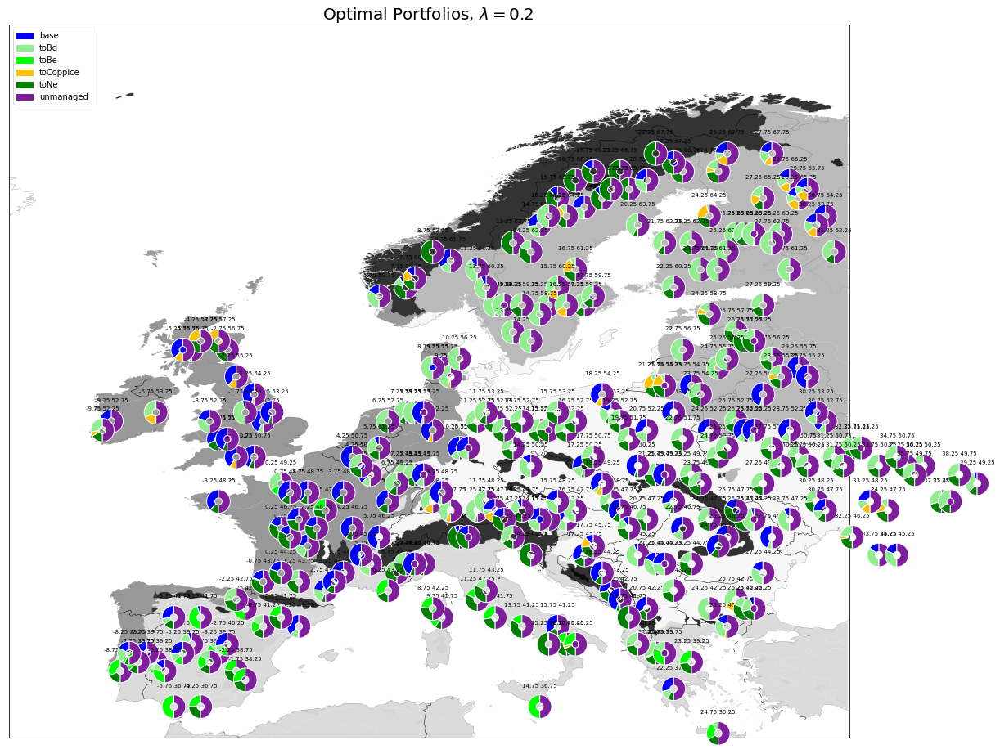

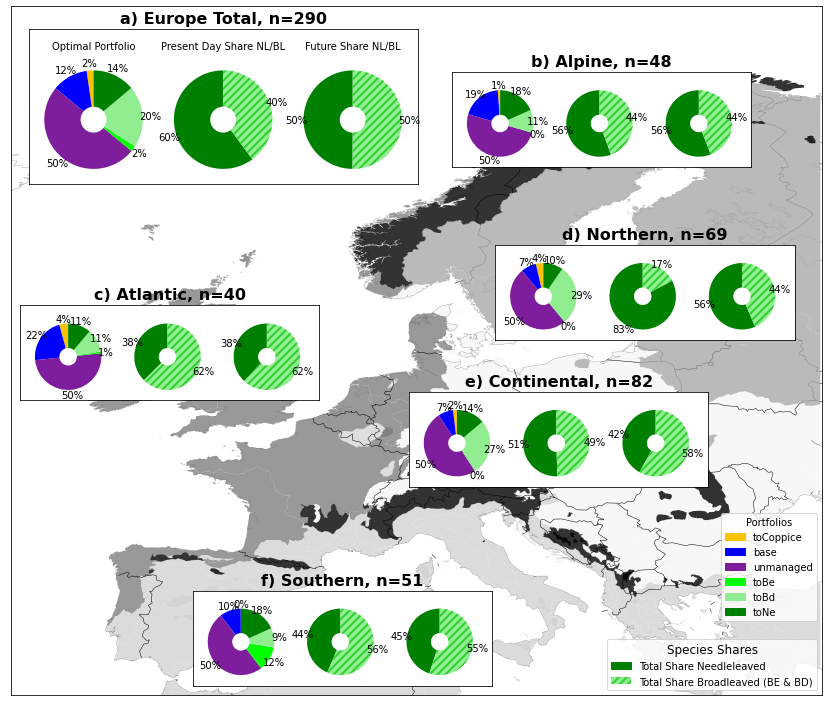

In [24]:
_ = plot_result(sample_optimized_maximin_constrained_cell)

# All constraints

From present-day analysis, we can find the values for harvests and harvest for long-lived products. Plugging these as constraints into the optimization yields:

## Constraint data

In [25]:
def get_present_day_harvests(type, gridlist):
    global skipped, total_harv, total_harv2, idx, row, harv_m3_per_ha, gc_area_ha
    skipped = 0
    from optimize_gridcell import FACTOR_TO_HAVE_LOW_VALUES
    total_harv = 0
    total_harv2 = 0

    optimization_input_data = pd.read_pickle(OPTIMIZATION_DATA_FILE).set_index(['Lon', 'Lat']).loc[gridlist].reset_index()
    
    for idx, row in optimization_input_data.iterrows():
        if row['add_constraint_base_values']:
            harv_m3_per_ha = row['add_constraint_base_values'][type]
            gc_area_ha = row['area'] / 10000.0
            total_harv += harv_m3_per_ha * gc_area_ha
            total_harv2 += harv_m3_per_ha
        else:
            skipped += 1
    total_harv /= FACTOR_TO_HAVE_LOW_VALUES
    print('skipped', skipped, 'cells')
    return total_harv

In [26]:
gridlist = pd.read_csv('optimization_datasets/gridlist_every_tenth_europe.txt', delim_whitespace=True, names=['Lon', 'Lat']).set_index(['Lon', 'Lat'])
lonslats = gridlist.reset_index()[['Lon', 'Lat']].drop_duplicates().apply(tuple, axis=1)
get_present_day_harvests('harvest', lonslats), 10000 * get_present_day_harvests('hlp', lonslats)

skipped 0 cells
skipped 0 cells


(0.5500250419463463, 34.358919979751725)

In [27]:
sample_optimized_sum_all_constraints = run_optimization.run_optimization(
    run_dir=MODEL_OUTPUTS_DIRECTORY,
    gridlist=GRIDLIST_300_CELLS,
    minmax=False,
    unmanaged_constraint=0.138,
    harvest_constraint_m3=0.55,
    hlp_constraint_m3=34.36,
    dataset_prepared_for_optimization=OPTIMIZATION_DATA_FILE)

### Starting, 2024-07-06 16:16:23.669424
Combining all inputs into one LP
SKIP GC!41.75, 22.75
SKIP GC!44.25, 23.75
SKIP GC!45.75, 29.25
SKIP GC!45.25, 28.25
size of LP, eqs: (290, 2030) , ineqs: (8123, 2030)
Starting optimization...
Optimization is done.
Aggregating results
### Done. 2024-07-06 16:17:25.601645


did not find a region for 0 cells


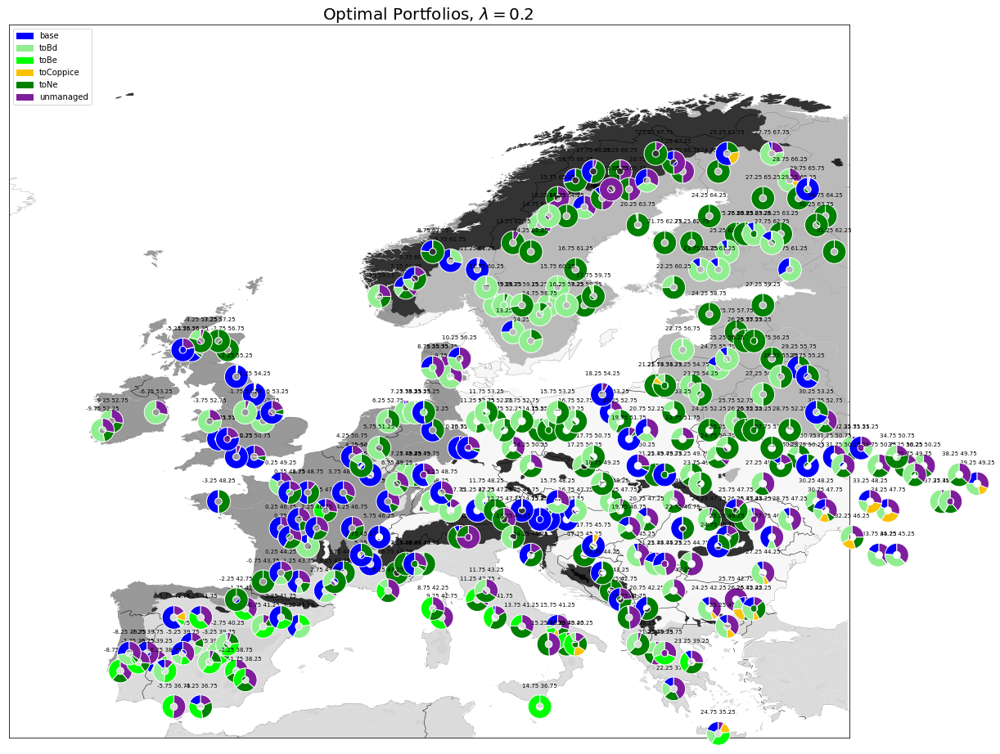

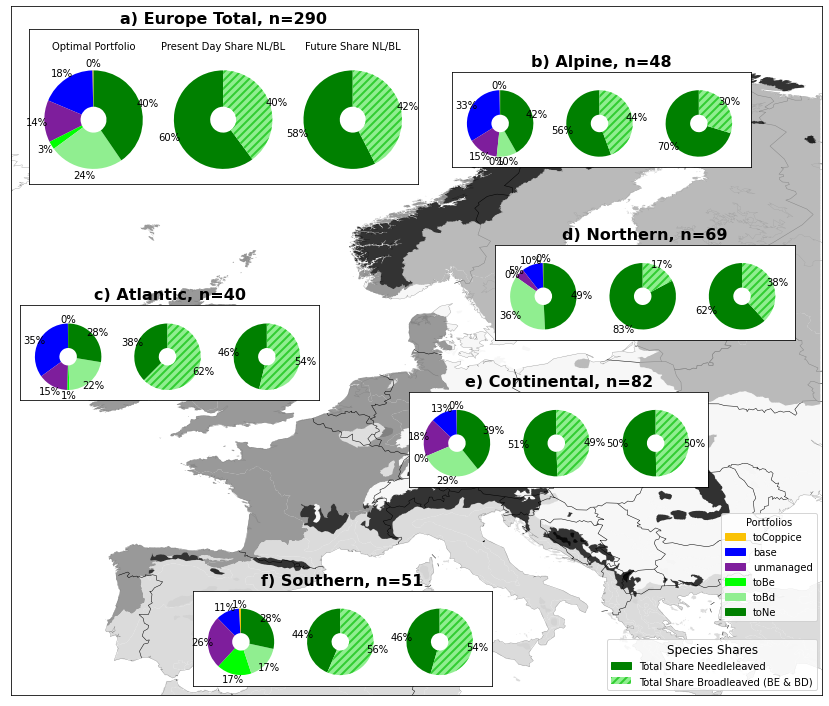

In [28]:
_ = plot_result(sample_optimized_sum_all_constraints)

We see the similar results to the paper (that uses 3000 grid cells): no promotion of broad-leaved forests, and an unfair distribution of unmanaged forests.